# Note to Participants 
The code is adapted from an implementation from https://github.com/huggingface/transformers/issues/28778, utilizing a custom loss function and is meant to broadly point participants in the general direction of what it would take to fine-tune the OWL-ViT model. As such, teams are strongly encouraged to explore, change, and improve the training script that follows.

# Library

In [1]:
import torch
import os
torch.cuda.empty_cache()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


## Logging

In [2]:
import logging

# Configure logging (example for `logging` module)
logging.basicConfig(
    level=logging.WARNING,  # Adjust as needed (DEBUG, INFO, WARNING, ERROR, CRITICAL)
    format='%(asctime)s - %(name)s - %(levelname)s - %(message)s'
)


In [2]:
import pickle

In [3]:
with open("empty_weight.pkl", 'rb') as f:
    empty = pickle.load(f)

In [4]:
with open("pos_targets.pkl", 'rb') as f:
    pos = pickle.load(f)

In [5]:
with open("pred_log.pkl", 'rb') as f:
    log = pickle.load(f)

In [7]:
pos

tensor([[[0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.]],

        [[0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.]],

        [[0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.]],

        ...,

        [[0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0.,  ..., 0., 0., 1.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 1.],
         [0., 0., 0., 

In [13]:
log<0

tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [

In [24]:
min_value = torch.min(pos).item()
max_value = torch.max(pos).item()
min_value, max_value

(0.0, 1.0)

In [25]:
min_value = torch.min(log).item()
max_value = torch.max(log).item()
min_value, max_value

(0.0, 12.921875)

In [30]:
torch.nn.BCELoss(reduction="none", weight=empty.cpu())(torch.nn.functional.softmax(log).float().cpu(), pos.float().cpu())

/var/tmp/ipykernel_111767/3589605560.py:1: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  torch.nn.BCELoss(reduction="none", weight=empty.cpu())(torch.nn.functional.softmax(log).float().cpu(), pos.float().cpu())


tensor([[[0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.2773],
         [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.2773],
         [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.2773],
         ...,
         [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.2773],
         [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.2773],
         [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.2773]],

        [[0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.2773],
         [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.2773],
         [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.2773],
         ...,
         [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.2773],
         [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.2773],
         [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.2773]],

        [[0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.2773],
         [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.2773],
         [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.

# References
- https://github.com/huggingface/transformers/issues/28778
- https://github.com/NielsRogge/Transformers-Tutorials/blob/master/DETR/Fine_tuning_DetrForObjectDetection_on_custom_dataset_(balloon).ipynb

Also helpful, but through google's research scenic repo
- https://github.com/google-research/scenic/issues/542

And also, nvidia implement
- https://github.com/NVIDIA-AI-IOT/nanoowl

# Data

- https://huggingface.co/datasets/cppe-5

## Dataset Summary

CPPE - 5 (Medical Personal Protective Equipment) is a new challenging dataset with the goal to allow the study of subordinate categorization of medical personal protective equipments, which is not possible with other popular data sets that focus on broad level categories.

Some features of this dataset are:

- high quality images and annotations (~4.6 bounding boxes per image)
- real-life images unlike any current such dataset
- majority of non-iconic images (allowing easy deployment to real-world environments)

In [3]:
"""
from datasets import Dataset
my_dict = {"a": [1, 2, 3]}
dataset = Dataset.from_dict(my_dict)

from datasets import Dataset

data = [{'col1':'foo1','col2':'bar1'}, {'col1':'foo2','col2':'bar2'},...,{'col1':'foon','col2':'barn'}]
dataset = Dataset.from_list(data)

{
  'image_id': 15,
  'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=943x663 at 0x2373B065C18>,
  'width': 943,
  'height': 663,
  'objects': {
    'id': [114, 115, 116, 117], 
    'area': [3796, 1596, 152768, 81002],
    'bbox': [
      [302.0, 109.0, 73.0, 52.0],
      [810.0, 100.0, 57.0, 28.0],
      [160.0, 31.0, 248.0, 616.0],
      [741.0, 68.0, 202.0, 401.0]
    ], 
    'category': [4, 4, 0, 0]
  }
}
"""

'\nfrom datasets import Dataset\nmy_dict = {"a": [1, 2, 3]}\ndataset = Dataset.from_dict(my_dict)\n\nfrom datasets import Dataset\n\ndata = [{\'col1\':\'foo1\',\'col2\':\'bar1\'}, {\'col1\':\'foo2\',\'col2\':\'bar2\'},...,{\'col1\':\'foon\',\'col2\':\'barn\'}]\ndataset = Dataset.from_list(data)\n\n{\n  \'image_id\': 15,\n  \'image\': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=943x663 at 0x2373B065C18>,\n  \'width\': 943,\n  \'height\': 663,\n  \'objects\': {\n    \'id\': [114, 115, 116, 117], \n    \'area\': [3796, 1596, 152768, 81002],\n    \'bbox\': [\n      [302.0, 109.0, 73.0, 52.0],\n      [810.0, 100.0, 57.0, 28.0],\n      [160.0, 31.0, 248.0, 616.0],\n      [741.0, 68.0, 202.0, 401.0]\n    ], \n    \'category\': [4, 4, 0, 0]\n  }\n}\n'

In [1]:
#from datasets import load_dataset
#cppe5 = load_dataset("cppe-5")
#make custom image dataset
import json
from datasets import Dataset
import string
with open('./get_data_info/new_annot.json', 'r') as fp:
    coco_annot = json.load(fp)

coco_annot = coco_annot['images']
id = 0

for i in range(len(coco_annot)):
    caption = []
    category = []
    is_crowd = []
    bbox = []
    area = []
    id_li = []
    for annots in coco_annot[i]['annotations']:
        out = annots['caption'].translate(str.maketrans('', '', string.punctuation))
        out = out.replace(' ', '_')
        caption.append(out)
        category.append(annots['category_id'])
        is_crowd.append(annots['is_crowd'])
        area.append(annots['area'])
        bbox.append(annots['bbox'])
        id_li.append(id)
        id += 1
    coco_annot[i]['annotations'] = {'caption': caption, 'category': category, 'is_crowd': is_crowd,
                                'bbox': bbox, 'area': area, 'id': id_li}

    

# image: path, annotations: list[dict(caption: category_id: is_crowd: area:)]
# image_id
vlm_data = Dataset.from_list(coco_annot)

with open('./get_data_info/new_label.json', 'r') as fp:
    id2label = json.load(fp)
#insert no detection=
#id2label['126'] = "NA"
label2id = {v: k for k, v in id2label.items()}
categories = list(label2id.keys())
#categories = cppe5["train"].features["objects"].feature["category"].names
#id2label = {index: x for index, x in enumerate(categories, start=0)}


text_inputs =list(id2label.values())
print(text_inputs)

['yellow and black fighter plane', 'white and black drone', 'white and blue fighter jet', 'white cargo aircraft', 'orange and black fighter jet', 'white, red, and green fighter plane', 'black and brown camouflage helicopter', 'yellow, red, and grey helicopter', 'white light aircraft', 'red and white fighter jet', 'white and blue helicopter', 'green and yellow fighter plane', 'grey and red missile', 'white missile', 'green light aircraft', 'grey cargo aircraft', 'white, black, and red drone', 'black drone', 'yellow and red light aircraft', 'yellow commercial aircraft', 'orange light aircraft', 'white and red fighter jet', 'white and red commercial aircraft', 'black and white commercial aircraft', 'white and black helicopter', 'grey and white light aircraft', 'black fighter plane', 'red fighter plane', 'white, blue, and red commercial aircraft', 'grey and yellow fighter plane', 'white and blue light aircraft', 'blue camouflage fighter jet', 'blue and red commercial aircraft', 'blue and r

In [11]:
def insert_no_detect(examples):
    for i, annotations in enumerate(examples["annotations"]):
        examples["annotations"][i]['area'].append(int((1520*870)))
        examples["annotations"][i]['caption'].append('no detection')
        #Fill entire image for no prediction
        examples["annotations"][i]["bbox"].append([0,0,1520,870])
        examples["annotations"][i]["category"].append(126)
        examples["annotations"][i]["id"].append(examples["annotations"][i]["id"][-1]+1)
        #shift our ids
        examples["annotations"][i]["id"] = [j+examples["image_id"][i] for j in examples["annotations"][i]["id"]]
        examples["annotations"][i]['is_crowd'].append(1)
    return examples

In [12]:
#vlm_data = vlm_data.map(insert_no_detect, batched=True, batch_size=16)

In [6]:
vlm_data[5]

{'image': 'image_5.jpg',
 'annotations': {'area': [4960, 3648, 1280, 480],
  'bbox': [[956, 88, 124, 40],
   [772, 464, 76, 48],
   [652, 452, 32, 40],
   [1084, 356, 40, 12]],
  'caption': ['silver fighter plane',
   'white and orange light aircraft',
   'red and white fighter jet',
   'grey and red missile'],
  'category': [35, 39, 9, 12],
  'id': [15, 16, 17, 18],
  'is_crowd': [1, 1, 1, 1]},
 'image_id': 5}

One common problem with datasets for object detection is bounding boxes that “stretch” beyond the edge of the image. Such “runaway” bounding boxes can raise errors during training and should be addressed at this stage. There are a few examples with this issue in this dataset. To keep things simple in this guide, we remove these images from the data.

Also, lets limit to only 100 training images.

In [14]:
# remove image with bounding boxes outstreched
#remove_idx = [590, 821, 822, 875, 876, 878, 879]
#keep = [i for i in range(len(cppe5["train"])) if i not in remove_idx]

# limit to 100 images
#keep = keep[0:100]
#cppe5["train"] = cppe5["train"].select(keep)

illustrate one of the image

In [15]:
# import cv2

# def ltwh2xcycwh(examples):
#     for i, annotations in enumerate(examples["annotations"]):
#         box_coords = []
#         for box in annotations["bbox"]:
#             l, t, w, h = tuple(box)
#             x = l+w/2
#             y = t+h/2
#             box_coords.append([x, y, w, h])
#         examples["annotations"][i]["bbox"] = box_coords
#     return examples

In [16]:
#vlm_data = vlm_data.map(ltwh2xcycwh, batched=True, batch_size=16)

In [17]:
vlm_data[0]

{'image': 'image_0.jpg',
 'annotations': {'area': [1584, 2016, 4608],
  'bbox': [[1224, 284, 44, 36], [688, 400, 56, 36], [800, 320, 128, 36]],
  'caption': ['blue and white missile',
   'green light aircraft',
   'blue and white commercial aircraft'],
  'category': [111, 14, 37],
  'id': [0, 1, 2],
  'is_crowd': [1, 1, 1]},
 'image_id': 0}

In [18]:
# vlm_data

In [19]:
# #UPDATE WE DONT NEED TO NORMALISE IT
# #normalize bbox
# import cv2
# #Need to fix normalisation to xyxy instead of xywh
# def normalise(bbox, image_width, image_height):
#     left, top, width, height = bbox
#     # Calculate normalized coordinates
#     normalized_left = left / image_width
#     normalized_top = top / image_height
#     normalized_width = width / image_width
#     normalized_height = height / image_height
#     # Ensure values are within [0, 1]
#     normalized_left = max(0, min(normalized_left, 1))
#     normalized_top = max(0, min(normalized_top, 1))
#     normalized_width = max(0, min(normalized_width, 1))
#     normalized_height = max(0, min(normalized_height, 1))
#     return normalized_left, normalized_top, normalized_width, normalized_height

# def ltwh_to_xyxy(bbox):
#     left, top, width, height = bbox
#     xmin = left
#     ymin = top
#     xmax = left + width
#     ymax = top + height
#     return xmin, ymin, xmax, ymax

# def normalize_bbox(example):
#     box_coord = []
#     image = f'../novice/images/{example["image"]}'
#     image = cv2.imread(image)
#     height, width, c = image.shape
#     for box in example["annotations"]["bbox"]:
        
#         x, y, w, h = tuple(box)
#         # Check if coordinates are normalized or not
#         if max(box) > 1.0:
#             x, y, w, h = normalise(tuple(box), width, height)
#             # Coordinates are un-normalized
#         box_coord.append([x, y, w, h])
#     example["annotations"]["bbox"] = box_coord
#     return example

# def normalize_bbox_batch(examples):
#     normalized_examples = []
    
#     for i, annotations in enumerate(examples["annotations"]):
#         height, width,= 870, 1520 
#         box_coords = []
#         for box in annotations["bbox"]:
#             x, y, w, h = box
#             # Check if coordinates are normalized or not
#             if max(box) > 1.0:
#                 x, y, w, h = normalise((x, y, w, h), width, height)
#             box_coords.append([x, y, w, h])
#         examples["annotations"][i]["bbox"] = box_coords
#     return examples

# vlm_data_norm = vlm_data.map(normalize_bbox_batch, batched=True, batch_size=16, num_proc=16)
    

In [20]:
# vlm_data_norm[0]

In [7]:
import numpy as np
import os
from PIL import Image, ImageDraw
# vlm_cp = vlm_data
# idx = 10
# image = vlm_data_norm[idx]["image"]
# image_2 = cv2.imread(f"../novice/images/{image}")
# height, width, c = image_2.shape
# annotations = vlm_data_norm[idx]["annotations"]
# categories = annotations["caption"]
# boxes = annotations["bbox"]
# _id2label = {index: x for index, x in enumerate(categories, start=0)}
# print(id2label)
# _label2id = {v: k for k, v in _id2label.items()}
# im = Image.open(f"../novice/images/{image}")
# draw = ImageDraw.Draw(im)
# for class_idx, box in enumerate(boxes):
#     x, y, w, h = tuple(box)
#     # Check if coordinates are normalized or not
#     if max(box) > 1.0:
#         # Coordinates are un-normalized, no need to re-scale them
#         x1, y1 = int(x), int(y)
#         x2, y2 = int(x + w), int(y + h)
#     else:
#         # Coordinates are normalized, re-scale them
#         print("norm")
#         x1 = int(x * width)
#         y1 = int(y * height)
#         x2 = int((x + w) * width)
#         y2 = int((y + h) * height)
#     draw.rectangle((x1, y1, x2, y2), outline="red", width=1)
#     draw.text((x1, y1), _id2label[class_idx], fill="white")

# im


# Model & Processor

In [62]:
import cv2

In [23]:
vlm_data[0]

{'image': 'image_0.jpg',
 'annotations': {'area': [1584, 2016, 4608],
  'bbox': [[1224, 284, 44, 36], [688, 400, 56, 36], [800, 320, 128, 36]],
  'caption': ['blue and white missile',
   'green light aircraft',
   'blue and white commercial aircraft'],
  'category': [111, 14, 37],
  'id': [0, 1, 2],
  'is_crowd': [1, 1, 1]},
 'image_id': 0}

In [20]:
image_processor

Owlv2ImageProcessor {
  "_valid_processor_keys": [
    "images",
    "do_pad",
    "do_resize",
    "size",
    "do_rescale",
    "rescale_factor",
    "do_normalize",
    "image_mean",
    "image_std",
    "return_tensors",
    "data_format",
    "input_data_format"
  ],
  "do_normalize": true,
  "do_pad": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.48145466,
    0.4578275,
    0.40821073
  ],
  "image_processor_type": "Owlv2ImageProcessor",
  "image_std": [
    0.26862954,
    0.26130258,
    0.27577711
  ],
  "processor_class": "Owlv2Processor",
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 960,
    "width": 960
  }
}

In [19]:
from transformers import AutoImageProcessor
from transformers import AutoProcessor

# using image processor from detr
image_processor = AutoImageProcessor.from_pretrained("facebook/detr-resnet-50", device="cuda:0")

checkpoint = "google/owlvit-base-patch32"
processor = AutoProcessor.from_pretrained(checkpoint)

from transformers import AutoModelForZeroShotObjectDetection

model = AutoModelForZeroShotObjectDetection.from_pretrained(
    checkpoint,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=False,
)
model.to(device)

print("loaded!")

# other better checkpoints, but would run out of memory with current T4 instance for fine-tuning, could be use for inference
# google/owlv2-base-patch16
# google/owlv2-large-patch14-finetuned
# google/owlv2-base-patch16-ensemble
# while with significant better performance, would run into OOM (Out of memory)

loaded!


In [40]:
image_processor

DetrImageProcessor {
  "_valid_processor_keys": [
    "images",
    "annotations",
    "return_segmentation_masks",
    "masks_path",
    "do_resize",
    "size",
    "resample",
    "do_rescale",
    "rescale_factor",
    "do_normalize",
    "do_convert_annotations",
    "image_mean",
    "image_std",
    "do_pad",
    "format",
    "return_tensors",
    "data_format",
    "input_data_format"
  ],
  "do_convert_annotations": true,
  "do_normalize": true,
  "do_pad": true,
  "do_rescale": true,
  "do_resize": true,
  "format": "coco_detection",
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "DetrImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "longest_edge": 1333,
    "shortest_edge": 800
  }
}

## Testing raw owl-vit model on image data
- via pipeline

In [41]:
from transformers import pipeline

detector = pipeline(model=checkpoint, task="zero-shot-object-detection", device="cuda:0") #checkpoint
# image = vlm_data[11]["image"]
# im = Image.open(f"../novice/images/{image}")

# predictions = detector(
#     im,
#     candidate_labels=['white and blue fighter jet', ], 
#     threshold=0.01,
#     top_k=8
# )
# print(predictions)

# from PIL import ImageDraw


# draw = ImageDraw.Draw(im)

# for prediction in predictions:
#     box = prediction["box"]
#     label = prediction["label"]
#     score = prediction["score"]

#     xmin, ymin, xmax, ymax = box.values()
#     draw.rectangle((xmin, ymin, xmax, ymax), outline="red", width=1)
#     draw.text((xmin, ymin), f"{label}: {round(score,2)}", fill="white")


# im



Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.


# Helper 
- prestransform the images and also setup the datasets

In [20]:
import albumentations
import numpy as np
from PIL import Image
import cv2
#resize and keep our aspect ratios
transform = albumentations.Compose(
    [
        albumentations.Resize(800, 800),
        albumentations.HorizontalFlip(p=0.5),
        albumentations.RandomBrightnessContrast(p=0.5),
    ],
    bbox_params=albumentations.BboxParams(format="coco", label_fields=["category"], clip=True),
)


def formatted_anns(image_id, category, area, bbox):
    annotations = []
    for i in range(0, len(category)):
        new_ann = {
            "image_id": image_id,
            "category_id": category[i],
            "isCrowd": 0,
            "area": area[i],
            "bbox": list(bbox[i]),
        }
        annotations.append(new_ann)

    return annotations

# transforming a batch
def transform_aug_ann(examples):
    image_ids = examples["image_id"]
    images, bboxes, area, categories = [], [], [], []
    transformed_data = []
    for image, objects in zip(examples["image"], examples["annotations"]):
        image = cv2.imread(f'../novice/images/{image}')
        out = transform(image=image, bboxes=objects["bbox"], category=objects["category"])
        area.append(objects["area"])
        images.append(out["image"])
        bboxes.append(out["bboxes"])
        categories.append(out["category"])
        #use an owlvit processor to translate text, image data
        transformed_data.append(processor(text=text_inputs, images=image, return_tensors="pt"))
    return {"transformed_data":transformed_data}

# transforming a batch
def transform_aug_ann_labels(examples):
    image_ids = examples["image_id"]
    images, bboxes, area, categories = [], [], [], []
    for image, objects in zip(examples["image"], examples["annotations"]):
        image = cv2.imread(f'../novice/images/{image}')
        #applying modifications to our image
        out = transform(image=image, bboxes=objects["bbox"], category=objects["category"])
        area.append(objects["area"])
        images.append(out["image"])
        bboxes.append(out["bboxes"])
        categories.append(out["category"])
    targets = [
        {"image_id": id_, "annotations": formatted_anns(id_, cat_, ar_, box_)}
        for id_, cat_, ar_, box_ in zip(image_ids, categories, area, bboxes)
    ]
    
    #Use detr to process our images
    return image_processor(images=images, annotations=targets, return_tensors="pt")

def collate_fn(batch):
    input_ids = torch.Tensor(np.array([item["input_ids"] for item in batch])).int()
    input_ids = input_ids.to(device)
    attention_mask = torch.Tensor(np.array([item["attention_mask"] for item in batch])).int()
    attention_mask = attention_mask.to(device)
    pixel_values = torch.Tensor(np.array([item["pixel_values"] for item in batch]))
    pixel_values = pixel_values.to(device)
    labels = []
    for item in batch:
        for (key, value) in item["labels"].items():
            item["labels"][key] = torch.Tensor(value).to(device)
        labels.append(item["labels"])
     
    batch = {}
    batch["input_ids"] = input_ids
    batch["attention_mask"] = attention_mask
    batch["pixel_values"] = pixel_values
    batch["labels"] = labels
    return batch

In [21]:
vlm_data_split = vlm_data.train_test_split(test_size=200)

In [22]:
#cast ds to iterable ds
vlm_train = vlm_data.to_iterable_dataset(num_shards=4)
vlm_test = vlm_data_split["test"].to_iterable_dataset(num_shards=4)
#cast ds to iterable ds

#applying to the datasets
transform_1 = vlm_train.map(transform_aug_ann, batched=True, batch_size=16)
transform_2 = vlm_train.map(transform_aug_ann_labels, batched=True, batch_size=16)


#applying to the datasets
transform_1_test = vlm_test.map(transform_aug_ann, batched=True, batch_size=16)
transform_2_test = vlm_test.map(transform_aug_ann_labels, batched=True, batch_size=16)

In [45]:
#next(iter(vlm_train))

In [23]:
next(iter(transform_1))

{'image': 'image_0.jpg',
 'annotations': {'area': [1584, 2016, 4608],
  'bbox': [[1224, 284, 44, 36], [688, 400, 56, 36], [800, 320, 128, 36]],
  'caption': ['blue_and_white_missile',
   'green_light_aircraft',
   'blue_and_white_commercial_aircraft'],
  'category': [111, 14, 37],
  'id': [0, 1, 2],
  'is_crowd': [1, 1, 1]},
 'image_id': 0,
 'transformed_data': {'input_ids': tensor([[49406,  4481,   318,  ...,     0,     0,     0],
         [49406,  1579,   318,  ...,     0,     0,     0],
         [49406,  1579,   318,  ...,     0,     0,     0],
         ...,
         [49406,  5046,   318,  ...,     0,     0,     0],
         [49406,  5046,   318,  ...,     0,     0,     0],
         [49406,   736,   318,  ...,     0,     0,     0]]), 'attention_mask': tensor([[1, 1, 1,  ..., 0, 0, 0],
         [1, 1, 1,  ..., 0, 0, 0],
         [1, 1, 1,  ..., 0, 0, 0],
         ...,
         [1, 1, 1,  ..., 0, 0, 0],
         [1, 1, 1,  ..., 0, 0, 0],
         [1, 1, 1,  ..., 0, 0, 0]]), 'pixel_val

In [24]:
next(iter(transform_2))

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


{'image': 'image_0.jpg',
 'annotations': {'area': [1584, 2016, 4608],
  'bbox': [[1224, 284, 44, 36], [688, 400, 56, 36], [800, 320, 128, 36]],
  'caption': ['blue_and_white_missile',
   'green_light_aircraft',
   'blue_and_white_commercial_aircraft'],
  'category': [111, 14, 37],
  'id': [0, 1, 2],
  'is_crowd': [1, 1, 1]},
 'image_id': 0,
 'pixel_values': tensor([[[ 2.1804,  2.1804,  2.1633,  ..., -1.9124, -1.8610, -1.8782],
          [ 2.1804,  2.1804,  2.1804,  ..., -1.9467, -1.8782, -1.8782],
          [ 2.1633,  2.1804,  2.1804,  ..., -1.9295, -1.8610, -1.8782],
          ...,
          [ 0.1254,  0.1426,  0.1426,  ..., -1.2274, -1.1932, -1.3130],
          [-0.0972, -0.1828, -0.1486,  ..., -1.3130, -1.2274, -1.2617],
          [-0.7479, -0.8335, -0.7479,  ..., -1.3987, -1.2788, -1.2788]],
 
         [[ 2.3761,  2.3761,  2.3585,  ..., -1.6155, -1.5805, -1.6331],
          [ 2.3761,  2.3761,  2.3761,  ..., -1.6506, -1.6155, -1.6331],
          [ 2.3585,  2.3761,  2.3761,  ..., -1.

In [25]:
#next(iter(transform_2_test))

In [26]:
#next(iter(transform_1_test))

## Encoding the data into Dataset

In [21]:
import pandas as pd
from datasets import Dataset
from tqdm import tqdm

def dataset_prep(transform_1, transform_2):
    data = []
    for i in tqdm(range(len(transform_1))):
        dict_ = {}
        dict_["input_ids"] = transform_1[i]["transformed_data"]["input_ids"]
        dict_["attention_mask"] = transform_1[i]["transformed_data"]["attention_mask"]
        dict_["pixel_values"] = transform_1[i]["transformed_data"]["pixel_values"][0]
        dict_["labels"] = transform_2[i]["labels"]
        data.append(dict_)

    # Preprocessed Training Data
    x_dataset = Dataset.from_list(data)
    return x_dataset

In [30]:
from datasets import IterableDataset

In [48]:
class CustomConcatDataset(IterableDataset):
    def __init__(self, dataset1, dataset2):
        self.dataset1 = dataset1
        self.dataset2 = dataset2
    def __iter__(self):
        # Iterate over examples from both datasets
        for example_1, example_2 in zip(self.dataset1, self.dataset2):
            dict_ = {}
            dict_["input_ids"] = example_1["transformed_data"]["input_ids"]
            dict_["attention_mask"] = example_1["transformed_data"]["attention_mask"]
            dict_["pixel_values"] = example_1["transformed_data"]["pixel_values"][0]
            dict_["labels"] = example_2["labels"]
            yield dict_
    def __len__(self):
        #pls leave it here it allows model to train
        return 5000

In [32]:
from datasets import concatenate_datasets

#Here our new dataset has the following features
#input_ids, attention_mask, pixel_values and the label
#label has the following 'size': tensor([im_width, im_height]), 'image_id': tensor([id_of_image]), 'class_labels': tensor([id_of_class1,  id_of_class2,...]), 'boxes':tensor([[smth, smth, smth,smth],
train_dataset = CustomConcatDataset(transform_1, transform_2)
# train_iter = iter(train_dataset)
# for i in range(5):
#     print(next(train_iter))
# train_dataset.features

test_dataset = CustomConcatDataset(transform_1_test, transform_2_test)
#print(next(iter(test_dataset)))
# test_dataset.features


In [34]:
#print(next(iter(train_dataset))['input_ids'].shape)

In [35]:
model

OwlViTForObjectDetection(
  (owlvit): OwlViTModel(
    (text_model): OwlViTTextTransformer(
      (embeddings): OwlViTTextEmbeddings(
        (token_embedding): Embedding(49408, 512)
        (position_embedding): Embedding(16, 512)
      )
      (encoder): OwlViTEncoder(
        (layers): ModuleList(
          (0-11): 12 x OwlViTEncoderLayer(
            (self_attn): OwlViTAttention(
              (k_proj): Linear(in_features=512, out_features=512, bias=True)
              (v_proj): Linear(in_features=512, out_features=512, bias=True)
              (q_proj): Linear(in_features=512, out_features=512, bias=True)
              (out_proj): Linear(in_features=512, out_features=512, bias=True)
            )
            (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
            (mlp): OwlViTMLP(
              (activation_fn): QuickGELUActivation()
              (fc1): Linear(in_features=512, out_features=2048, bias=True)
              (fc2): Linear(in_features=2048, out_

## Detection

In [49]:
# Using Detr-Loss calculation https://github.com/facebookresearch/detr/blob/main/models/matcher.py
# https://www.kaggle.com/code/bibhasmondal96/detr-from-scratch
class BoxUtils(object):
    @staticmethod
    def box_cxcywh_to_xyxy(x):
        x_c, y_c, w, h = x.unbind(-1)
        b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
             (x_c + 0.5 * w), (y_c + 0.5 * h)]
        return torch.stack(b, dim=-1)

    @staticmethod
    def box_xyxy_to_cxcywh(x):
        x0, y0, x1, y1 = x.unbind(-1)
        b = [(x0 + x1) / 2, (y0 + y1) / 2,
             (x1 - x0), (y1 - y0)]
        return torch.stack(b, dim=-1)

    @staticmethod
    def rescale_bboxes(out_bbox, size):
        #scale our boxes by image dims
        img_h, img_w = size
        b = BoxUtils.box_cxcywh_to_xyxy(out_bbox)
        b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
        return b

    @staticmethod
    def box_area(boxes):
        """
        Computes the area of a set of bounding boxes, which are specified by its
        (x1, y1, x2, y2) coordinates.
        Arguments:
            boxes (Tensor[N, 4]): boxes for which the area will be computed. They
                are expected to be in (x1, y1, x2, y2) format
        Returns:
            area (Tensor[N]): area for each box
        """
        return (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1])
        
    @staticmethod
    # modified from torchvision to also return the union
    def box_iou(boxes1, boxes2):
        area1 = BoxUtils.box_area(boxes1)
        area2 = BoxUtils.box_area(boxes2)

        lt = torch.max(boxes1[:, None, :2], boxes2[:, :2])  # [N,M,2]
        rb = torch.min(boxes1[:, None, 2:], boxes2[:, 2:])  # [N,M,2]

        wh = (rb - lt).clamp(min=0)  # [N,M,2]
        inter = wh[:, :, 0] * wh[:, :, 1]  # [N,M]

        union = area1[:, None] + area2 - inter

        iou = inter / union
        return iou, union

    @staticmethod
    def generalized_box_iou(boxes1, boxes2):
        """
        Generalized IoU from https://giou.stanford.edu/
        The boxes should be in [x0, y0, x1, y1] format
        Returns a [N, M] pairwise matrix, where N = len(boxes1)
        and M = len(boxes2)
        """
        # degenerate boxes gives inf / nan results
        # so do an early check
        assert (boxes1[:, 2:] >= boxes1[:, :2]).all()
        assert (boxes2[:, 2:] >= boxes2[:, :2]).all()
        iou, union = BoxUtils.box_iou(boxes1, boxes2)

        lt = torch.min(boxes1[:, None, :2], boxes2[:, :2])
        rb = torch.max(boxes1[:, None, 2:], boxes2[:, 2:])

        wh = (rb - lt).clamp(min=0)  # [N,M,2]
        area = wh[:, :, 0] * wh[:, :, 1]

        return iou - (area - union) / area

# Custom trainer for hugging face transformer

In [50]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from scipy.optimize import linear_sum_assignment

class HungarianMatcher(nn.Module):
    """This class computes an assignment between the targets and the predictions of the network
    For efficiency reasons, the targets don't include the no_object. Because of this, in general,
    there are more predictions than targets. In this case, we do a 1-to-1 matching of the best predictions,
    while the others are un-matched (and thus treated as non-objects).
    """

    def __init__(self, cost_class: float = 1, cost_bbox: float = 1, cost_giou: float = 1):
        """Creates the matcher
        Params:
            cost_class: This is the relative weight of the classification error in the matching cost
            cost_bbox: This is the relative weight of the L1 error of the bounding box coordinates in the matching cost
            cost_giou: This is the relative weight of the giou loss of the bounding box in the matching cost
        """
        super().__init__()
        self.cost_class = cost_class
        self.cost_bbox = cost_bbox
        self.cost_giou = cost_giou
        assert cost_class != 0 or cost_bbox != 0 or cost_giou != 0, "all costs cant be 0"

    @torch.no_grad()
    def forward(self, outputs, targets):
        """ Performs the matching
        Params:
            outputs: This is a dict that contains at least these entries:
                 "pred_logits": Tensor of dim [batch_size, num_queries, num_classes] with the classification logits
                 "pred_boxes": Tensor of dim [batch_size, num_queries, 4] with the predicted box coordinates
            targets: This is a list of targets (len(targets) = batch_size), where each target is a dict containing:
                 "labels": Tensor of dim [num_target_boxes] (where num_target_boxes is the number of ground-truth
                           objects in the target) containing the class labels
                 "boxes": Tensor of dim [num_target_boxes, 4] containing the target box coordinates
        Returns:
            A list of size batch_size, containing tuples of (index_i, index_j) where:
                - index_i is the indices of the selected predictions (in order)
                - index_j is the indices of the corresponding selected targets (in order)
            For each batch element, it holds:
                len(index_i) = len(index_j) = min(num_queries, num_target_boxes)
        """
        # print(outputs, self.combine_target_batches(targets))
        # print(outputs.shape, targets)
        logging.info(f"{outputs.keys()=}")
        bs, num_queries = outputs["logits"].shape[:2]

        # We flatten to compute the cost matrices in a batch
        out_prob = outputs["logits"].flatten(0, 1).softmax(-1)  # [batch_size * num_queries, num_classes]
        out_bbox = outputs["pred_boxes"].flatten(0, 1)  # [batch_size * num_queries, 4]

        # Also concat the target labels and boxes
        tgt_ids = torch.cat([v["class_labels"] for v in targets])
        logging.info(f"forward - {tgt_ids}")
        tgt_ids = tgt_ids.int()
        logging.info(f"forward - {tgt_ids}")

        tgt_bbox = torch.cat([v["boxes"] for v in targets])

        # Compute the classification cost. Contrary to the loss, we don't use the NLL,
        # but approximate it in 1 - proba[target class].
        # The 1 is a constant that doesn't change the matching, it can be ommitted.
        cost_class = -out_prob[:, tgt_ids]

        # Compute the L1 cost between boxes
        cost_bbox = torch.cdist(out_bbox, tgt_bbox, p=1)

        # Compute the giou cost betwen boxes
        cost_giou = -BoxUtils.generalized_box_iou(
            BoxUtils.box_cxcywh_to_xyxy(out_bbox),
            BoxUtils.box_cxcywh_to_xyxy(tgt_bbox)
        )

        # Final cost matrix
        C = self.cost_bbox * cost_bbox + self.cost_class * cost_class + self.cost_giou * cost_giou
        C = C.view(bs, num_queries, -1).cpu()

        sizes = [len(v["boxes"]) for v in targets]
        indices = [linear_sum_assignment(c[i]) for i, c in enumerate(C.split(sizes, -1))]
        return [(torch.as_tensor(i, dtype=torch.int64), torch.as_tensor(j, dtype=torch.int64)) for i, j in indices]

class SetCriterion(nn.Module):
    """ This class computes the loss for DETR.
    The process happens in two steps:
        1) we compute hungarian assignment between ground truth boxes and the outputs of the model
        2) we supervise each pair of matched ground-truth / prediction (supervise class and box)
    """
    def __init__(self, num_classes, matcher, weight_dict, eos_coef, losses):
        """ Create the criterion.
        Parameters:
            num_classes: number of object categories, omitting the special no-object category
            matcher: module able to compute a matching between targets and proposals
            weight_dict: dict containing as key the names of the losses and as values their relative weight.
            eos_coef: relative classification weight applied to the no-object category
            losses: list of all the losses to be applied. See get_loss for list of available losses.
        """
        super().__init__()
        self.num_classes = num_classes
        self.matcher = matcher
        self.weight_dict = weight_dict
        self.eos_coef = eos_coef
        self.losses = losses
        empty_weight = torch.ones(self.num_classes)
        empty_weight[-1] = self.eos_coef
        self.register_buffer('empty_weight', empty_weight)
        
    def label_loss(self, outputs, targets, indices, num_boxes)
    
    
    
    
    def loss_labels(self, outputs, targets, indices, num_boxes):
        """Classification loss (NLL)
        targets dicts must contain the key "labels" containing a tensor of dim [nb_target_boxes]
        """
        logging.info(f"loss_labels - {outputs.keys()}")
        assert 'logits' in outputs
        src_logits = torch.abs(outputs['logits'])
        src_logits = src_logits.transpose(1, 2)
        device = src_logits.device
        idx = self._get_src_permutation_idx(indices)
        target_classes_o = torch.cat([t["class_labels"][J] for t, (_, J) in zip(targets, indices)]).to(torch.int64)
        #remember to subtract to ensure that we have 0 to x-1 as label for x classes
        target_classes = torch.full(src_logits.shape[:2], self.num_classes,
                                    dtype=torch.int64, device=device).to(torch.int64)
        
        target_classes[idx] = target_classes_o.unsqueeze(1).expand(49, 126)
        
        

        pred_logits = src_logits[:, target_classes != 126].t()
        bg_logits = src_logits[:, target_classes == 126].t()
        target_classes = target_classes[target_classes != 126]

        # Positive loss
        pos_targets = torch.nn.functional.one_hot(target_classes, 126)
        neg_targets = torch.zeros(bg_logits.shape).to(bg_logits.device)

        pos_loss = self.class_criterion(pred_logits, pos_targets.float())
        neg_loss = self.class_criterion(bg_logits, neg_targets)

        pos_loss = (torch.pow(1 - torch.exp(-pos_loss), 2) * pos_loss).sum(dim=1).mean()
        neg_loss = (torch.pow(1 - torch.exp(-neg_loss), 2) * neg_loss).sum(dim=1).mean()
        
        losses = {'loss_ce': pos_loss+neg_loss}

        return pos_loss+neg_loss

        # loss_ce = F.cross_entropy(src_logits.transpose(1, 2), target_classes, self.empty_weight)
        # losses = {'loss_ce': loss_ce}
        # return losses

    @torch.no_grad()
    def loss_cardinality(self, outputs, targets, indices, num_boxes):
        """ Compute the cardinality error, ie the absolute error in the number of predicted non-empty boxes
        This is not really a loss, it is intended for logging purposes only. It doesn't propagate gradients
        """
        pred_logits = outputs['logits']
        device = pred_logits.device
        tgt_lengths = torch.as_tensor([len(v["class_labels"]) for v in targets], device=device)
        # Count the number of predictions that are NOT "no-object" (which is the last class)
        card_pred = (pred_logits.argmax(-1) != pred_logits.shape[-1] - 1).sum(1)
        card_err = F.l1_loss(card_pred.float(), tgt_lengths.float())
        losses = {'cardinality_error': card_err.cpu()}
        return losses

    def loss_boxes(self, outputs, targets, indices, num_boxes):
        """Compute the losses related to the bounding boxes, the L1 regression loss and the GIoU loss
           targets dicts must contain the key "boxes" containing a tensor of dim [nb_target_boxes, 4]
           The target boxes are expected in format (center_x, center_y, w, h), normalized by the image size.
        """
        assert 'pred_boxes' in outputs
        idx = self._get_src_permutation_idx(indices)
        print(outputs['pred_boxes'].shape, targets)
        assert False
        src_boxes = outputs['pred_boxes'][idx]
        target_boxes = torch.cat([t['boxes'][i] for t, (_, i) in zip(targets, indices)], dim=0)

        loss_bbox = F.l1_loss(src_boxes, target_boxes, reduction='none')

        losses = {}
        losses['loss_bbox'] = loss_bbox.sum() / num_boxes

        loss_giou = 1 - torch.diag(BoxUtils.generalized_box_iou(
            BoxUtils.box_cxcywh_to_xyxy(src_boxes),
            BoxUtils.box_cxcywh_to_xyxy(target_boxes))
        )
        losses['loss_giou'] = loss_giou.sum() / num_boxes
        return losses

    def _get_src_permutation_idx(self, indices):
        # permute predictions following indices
        batch_idx = torch.cat([torch.full_like(src, i) for i, (src, _) in enumerate(indices)])
        src_idx = torch.cat([src for (src, _) in indices])
        return batch_idx, src_idx

    def _get_tgt_permutation_idx(self, indices):
        # permute targets following indices
        batch_idx = torch.cat([torch.full_like(tgt, i) for i, (_, tgt) in enumerate(indices)])
        tgt_idx = torch.cat([tgt for (_, tgt) in indices])
        return batch_idx, tgt_idx

    def get_loss(self, loss, outputs, targets, indices, num_boxes, **kwargs):
        """
        Runs the relevant loss function
        """
        loss_map = {
            'labels': self.loss_labels,
            'cardinality': self.loss_cardinality,
            'boxes': self.loss_boxes,
        }
        assert loss in loss_map, f'do you really want to compute {loss} loss?'
        return loss_map[loss](outputs, targets, indices, num_boxes, **kwargs)

    def forward(self, outputs, targets):
        """ This performs the loss computation.
        Parameters:
             outputs: dict of tensors, see the output specification of the model for the format
             targets: list of dicts, such that len(targets) == batch_size.
                      The expected keys in each dict depends on the losses applied, see each loss' doc
        """
        logging.info(f"{type(outputs)=}")
        logging.info(f"{type(targets)=}")
        outputs_without_aux = {k: v for k, v in outputs.items() if k != 'aux_outputs'}

        # Retrieve the matching between the outputs of the last layer and the targets
        indices = self.matcher(outputs_without_aux, targets)

        # Compute the average number of target boxes accross all nodes, for normalization purposes
        num_boxes = sum(len(t["class_labels"]) for t in targets)
        num_boxes = torch.as_tensor([num_boxes], dtype=torch.float, device=next(iter(outputs.values())).device)

        # Compute all the requested losses
        losses = {}
        for loss in self.losses:
            losses.update(self.get_loss(loss, outputs, targets, indices, num_boxes))
        return losses

# Putting it together

To compute the custom loss we defined, we need to create a custom Trainer that inherits from the Hugging Face Trainer class. This will allow us to override the compute_loss method and implement our custom loss calculation.

In [51]:
import multiprocessing as mp
#mp.set_start_method('spawn', force=True)
mp.set_start_method('fork', force=True)

In [78]:
import pickle
with open("test.pkl", 'rb') as f:
    train_dataset_1 = pickle.load(f)

In [81]:
next(iter(train_dataset))["input_ids"].shape

torch.Size([127, 16])

In [84]:
next(iter(train_dataset))["input_ids"][0]

tensor([49406,  4481,   537,  1449,  6438,  5363, 49407,     0,     0,     0,
            0,     0,     0,     0,     0,     0])

In [60]:
from transformers import TrainingArguments
#enable gradient checkpointing to allow higher batch size train
training_args = TrainingArguments(
    output_dir="owlvit-base-patch32_FT_cppe5",
    per_device_train_batch_size=16,
    warmup_steps=500,
    num_train_epochs=50,
    fp16=True,
    save_steps=500,
    logging_steps=500,
    learning_rate=1e-6, #1e-5
    weight_decay=1e-4,
    save_total_limit=10,
    lr_scheduler_type='cosine_with_restarts',
    remove_unused_columns=False,
    dataloader_pin_memory=False,
    gradient_checkpointing=True,
    gradient_accumulation_steps=1,
    push_to_hub=False,
    report_to=["tensorboard"],
)

# custom loss
def custom_loss(logits, labels):
    num_classes = len(text_inputs)
    matcher = HungarianMatcher(cost_class = 1, cost_bbox = 5, cost_giou = 2)
    weight_dict = {'loss_ce': 1, 'loss_bbox': 5, 'loss_giou': 2}
    losses = ['labels', 'boxes', 'cardinality']
    criterion = SetCriterion(num_classes, matcher=matcher, weight_dict=weight_dict, eos_coef=0.1, losses=losses)
    criterion.to(device)
    loss = criterion(logits, labels)
    return loss

# subclass trainer
from transformers import Trainer

class CustomTrainer(Trainer):
    def compute_loss(self, model, inputs, return_outputs=False):
        labels = inputs.pop("labels")
        inputs["input_ids"] = torch.flatten(inputs["input_ids"], start_dim=0, end_dim=1)
        print(inputs['pixel_values'].shape)
        inputs["attention_mask"] = torch.flatten(inputs["attention_mask"], start_dim=0, end_dim=1)
        outputs = model(**inputs, return_dict=True)
        print(outputs['logits'].shape)
        loss = custom_loss(outputs, labels)
        loss_ce = loss['loss_ce'].cpu().item()
        loss_bbox = loss['loss_bbox'].cpu().item()
        loss_giou = loss['loss_giou'].cpu().item()
        cardinality_error = loss['cardinality_error'].cpu().item()
        # print(
        #     f"loss_ce={loss_ce:.2f}",
        #     f"loss_bbox={loss_bbox:.2f}",
        #     f"loss_giou={loss_giou:.2f}",
        #     f"cardinality_error={cardinality_error:.2f}",
        #     sep="\t")
        loss = sum(loss.values())[0] #add
        return (loss, outputs) if return_outputs else loss

# use new trainer

trainer = CustomTrainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    train_dataset=train_dataset,
    tokenizer=processor,
 )
eval_dict = trainer.train()

torch.Size([16, 3, 768, 768])


/opt/conda/lib/python3.10/site-packages/torch/utils/checkpoint.py:464: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.4 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


torch.Size([16, 576, 126])
torch.Size([16, 576, 126]) torch.Size([126])


AssertionError: 

In [ ]:
#model might be outputing in cxcywh form

In [36]:
[i*256 for i in[0.7578947368421053, -0.004597701149425287, 0.8421052631578947, 0.0735632183908046]]

[194.02105263157895,
 -1.1770114942528735,
 215.57894736842104,
 18.832183908045977]

In [ ]:
model_path = "local/custom_owl_vit_1"
trainer.save_model(model_path)

# Evaluate
Similar with that of evaluater used in HF Object Detection, but adapted for owl vit

## Prediction

In [1]:
from PIL import ImageDraw
from transformers import pipeline

model_path = "./owlvit-base-patch32_FT_cppe5/checkpoint-10000"
detector = pipeline(model=model_path, task="zero-shot-object-detection", device="cuda:0")


2024-05-22 02:33:24.200644: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [8]:
from datasets import Dataset
import json
with open('./get_data_info/new_annot.json', 'r') as fp:
    coco_annot = json.load(fp)

coco_annot = coco_annot['images']
id = 0

for i in range(len(coco_annot)):
    caption = []
    category = []
    is_crowd = []
    bbox = []
    area = []
    id_li = []
    for annots in coco_annot[i]['annotations']:
        caption.append(annots['caption'])
        category.append(annots['category_id'])
        is_crowd.append(annots['is_crowd'])
        area.append(annots['area'])
        bbox.append(annots['bbox'])
        id_li.append(id)
        id += 1
    coco_annot[i]['annotations'] = {'caption': caption, 'category': category, 'is_crowd': is_crowd,
                                'bbox': bbox, 'area': area, 'id': id_li}

    

# image: path, annotations: list[dict(caption: category_id: is_crowd: area:)]
# image_id
vlm_data_test = Dataset.from_list(coco_annot).train_test_split(test_size=20)["test"]

In [9]:
vlm_data_test[0]

{'image': 'image_201.jpg',
 'annotations': {'area': [5984, 2240],
  'bbox': [[596, 304, 136, 44], [1104, 340, 56, 40]],
  'caption': ['green and brown camouflage helicopter', 'black drone'],
  'category': [108, 17],
  'id': [618, 619],
  'is_crowd': [1, 1]},
 'image_id': 201}

In [4]:
import cv2

In [9]:
with open("../novice/images/image_0.jpg", 'rb') as f:
    data = f.read()
from PIL import Image
from io import BytesIO
data = BytesIO(data)
imfdfd = Image.open(data)

In [10]:
x = detector(imfdfd, candidate_labels=["grey"], threshold=0.2, top_k=10)
imfdfd.close()
x

[{'score': 0.9709459543228149,
  'label': 'grey',
  'box': {'xmin': 1365, 'ymin': 505, 'xmax': 1672, 'ymax': 578}},
 {'score': 0.9633007645606995,
  'label': 'grey',
  'box': {'xmin': 1302, 'ymin': 602, 'xmax': 1735, 'ymax': 677}},
 {'score': 0.916769802570343,
  'label': 'grey',
  'box': {'xmin': 1444, 'ymin': 250, 'xmax': 1595, 'ymax': 303}},
 {'score': 0.9013498425483704,
  'label': 'grey',
  'box': {'xmin': 1305, 'ymin': 284, 'xmax': 1368, 'ymax': 326}},
 {'score': 0.8893229365348816,
  'label': 'grey',
  'box': {'xmin': 1280, 'ymin': 295, 'xmax': 1349, 'ymax': 341}},
 {'score': 0.8860125541687012,
  'label': 'grey',
  'box': {'xmin': 854, 'ymin': 321, 'xmax': 944, 'ymax': 361}},
 {'score': 0.8808335065841675,
  'label': 'grey',
  'box': {'xmin': 1132, 'ymin': 301, 'xmax': 1192, 'ymax': 346}},
 {'score': 0.8781748414039612,
  'label': 'grey',
  'box': {'xmin': 892, 'ymin': 328, 'xmax': 972, 'ymax': 366}},
 {'score': 0.8751035928726196,
  'label': 'grey',
  'box': {'xmin': 1449, 'ym

In [27]:
#candidates = ['yellow commercial aircraft', 'orange light aircraft', 'white and red fighter jet', 'white and red commercial aircraft', 'black and white commercial aircraft', 'white and black helicopter', 'grey and white light aircraft']
from tqdm import tqdm
finetune_prediction_dict = {}
for idx, i in tqdm(enumerate(vlm_data_test), total=20):
    predictions = detector(
        f'../novice/images/{i["image"]}',
        
        candidate_labels=i['annotations']['caption'],
        threshold=0.5,
        top_k=10
    )
    finetune_prediction_dict[idx] = predictions

100%|██████████| 20/20 [00:05<00:00,  3.75it/s]


In [28]:
finetune_prediction_dict

{0: [{'score': 0.9859181642532349,
   'label': 'black and white commercial aircraft',
   'box': {'xmin': 516, 'ymin': 168, 'xmax': 617, 'ymax': 205}},
  {'score': 0.9495256543159485,
   'label': 'yellow missile',
   'box': {'xmin': 1082, 'ymin': 136, 'xmax': 1111, 'ymax': 214}},
  {'score': 0.8128910660743713,
   'label': 'yellow missile',
   'box': {'xmin': 877, 'ymin': 15, 'xmax': 954, 'ymax': 306}},
  {'score': 0.7998688220977783,
   'label': 'green and brown camouflage helicopter',
   'box': {'xmin': 948, 'ymin': 134, 'xmax': 1025, 'ymax': 174}},
  {'score': 0.7977518439292908,
   'label': 'black and white commercial aircraft',
   'box': {'xmin': 632, 'ymin': 139, 'xmax': 748, 'ymax': 186}},
  {'score': 0.7963549494743347,
   'label': 'yellow missile',
   'box': {'xmin': 1076, 'ymin': 134, 'xmax': 1115, 'ymax': 218}},
  {'score': 0.7959988117218018,
   'label': 'black and white commercial aircraft',
   'box': {'xmin': 799, 'ymin': 140, 'xmax': 916, 'ymax': 183}},
  {'score': 0.7800

In [29]:
test_dt = vlm_data_test.to_pandas()

## Parser
- parsing the results and original data to that of torchmetrics mAP - https://lightning.ai/docs/torchmetrics/stable/detection/mean_average_precision.html

In [30]:
test_dt

,image,annotations,image_id
0,image_1210.jpg,"{'area': [9600, 2688, 3872, 4000], 'bbox': [[9...",1210
1,image_2322.jpg,"{'area': [1728, 672], 'bbox': [[536, 300, 48, ...",2322
2,image_2643.jpg,"{'area': [2592, 1024], 'bbox': [[344, 72, 72, ...",2643
3,image_3291.jpg,"{'area': [2304, 2560], 'bbox': [[608, 140, 64,...",3291
4,image_2365.jpg,"{'area': [2880, 2400, 5152], 'bbox': [[548, 39...",2365
5,image_4011.jpg,"{'area': [3456, 2496], 'bbox': [[196, 296, 72,...",4011
6,image_1499.jpg,"{'area': [2240, 4752, 1120, 1440], 'bbox': [[7...",1499
7,image_4054.jpg,"{'area': [2592, 1344, 2240], 'bbox': [[828, 32...",4054
8,image_3664.jpg,"{'area': [7072, 1920], 'bbox': [[1020, 400, 13...",3664
9,image_1997.jpg,"{'area': [480, 3840, 864], 'bbox': [[816, 104,...",1997


In [31]:
def convert_data(data):
  """
  Converts the given dictionary into a list of dictionaries with tensors.
  """

  result = []
  for i in range(len(data)):
    # Extract data for each instance
    # print(data[i])
    box_list = []
    label_list = []
    for j in range(len(data[i]['category'])):
        bbox = data[i]['bbox'][j]
        category = data[i]['category'][j]

        # Convert bbox to [x_min, y_min, x_max, y_max] format
        x_min, y_min, w, h = bbox
        x_max, y_max = x_min + w, y_min + h
        box = [x_min, y_min, x_max, y_max]
        
        box_list.append(box)
        label_list.append(category)
        
    # Create dictionary and append to result
    result.append(dict(
        boxes=torch.tensor(box_list, dtype=torch.float),
        # scores=torch.tensor([0.0]),  # Placeholder for scores (assuming not provided)
        labels=torch.tensor(label_list),
    ))
  return result

In [32]:
def parsing_prediction(prediction_dict):
    result = []
    for idx in prediction_dict:
        score_list, box_list, label_list = [], [], []
        # print(prediction_dict[idx])
        if prediction_dict[idx] :
                # for j in range(len(prediction_dict[idx])):
            box_list.append(
                [prediction_dict[idx][0]['box']['xmin'], 
                 prediction_dict[idx][0]['box']['ymin'], 
                 prediction_dict[idx][0]['box']['xmax'], 
                 prediction_dict[idx][0]['box']['ymax']])
            label_list.append(label2id[prediction_dict[idx][0]['label']])
            score_list.append(prediction_dict[idx][0]['score'])

            # Create dictionary and append to result
            label_list = [int(i) for i in label_list]
            result.append(dict(
                boxes=torch.tensor(box_list, dtype=torch.float),
                scores=torch.tensor(score_list),  # Placeholder for scores (assuming not provided)
                labels=torch.tensor(label_list),
            ))
        else:
            result.append(dict(
                boxes=torch.tensor([], dtype=torch.float),
                scores=torch.tensor([]),  # Placeholder for scores (assuming not provided)
                labels=torch.tensor([]),
            ))
            
    return result
        

In [33]:
import torch

In [34]:
finetune_prediction_parse_dict = parsing_prediction(finetune_prediction_dict)
#base_prediction_parse_dict = parsing_prediction(base_prediction_dict)
target = convert_data(test_dt['annotations'])

### Comparison

In [35]:
from torchmetrics.detection import MeanAveragePrecision
metric = MeanAveragePrecision(iou_type="bbox")

metric.update(finetune_prediction_parse_dict, target)
metric.compute()

{'map': tensor(0.2486),
 'map_50': tensor(0.3140),
 'map_75': tensor(0.3020),
 'map_small': tensor(0.3800),
 'map_medium': tensor(0.2510),
 'map_large': tensor(0.),
 'mar_1': tensor(0.2488),
 'mar_10': tensor(0.2488),
 'mar_100': tensor(0.2488),
 'mar_small': tensor(0.3800),
 'mar_medium': tensor(0.2513),
 'mar_large': tensor(0.),
 'map_per_class': tensor(-1.),
 'mar_100_per_class': tensor(-1.),
 'classes': tensor([  1,   3,   4,   8,   9,  11,  13,  17,  22,  23,  25,  28,  30,  31,
          34,  36,  39,  48,  50,  55,  63,  64,  67,  68,  71,  72,  74,  79,
          81,  82,  90,  93,  97,  98,  99, 100, 101, 103, 107, 108, 112, 124],
        dtype=torch.int32)}

In [36]:
metric.update(base_prediction_parse_dict, target)
metric.compute()

NameError: name 'base_prediction_parse_dict' is not defined

As we examine the metrics, we notice a slight improvement in the mean Average Precision (mAP) for the fine-tuned model compared to the pre-trained model. This indicates that fine-tuning has positively impacted the model's performance.


Moreover, we can observe that there is still potential for further improvement. By:
- Increasing the number of epochs
- Conducting hyperparameter tuning 
- Exploring additional optimization techniques

# Inference

## Fine-tuned model

In [6]:
vlm_data_test[0]

NameError: name 'vlm_data_test' is not defined

[{'score': 0.9812760353088379, 'label': 'ship', 'box': {'xmin': 1021, 'ymin': 312, 'xmax': 1121, 'ymax': 344}}, {'score': 0.9798727035522461, 'label': 'ship', 'box': {'xmin': 846, 'ymin': 269, 'xmax': 898, 'ymax': 294}}, {'score': 0.9796913266181946, 'label': 'ship', 'box': {'xmin': 1823, 'ymin': 266, 'xmax': 1909, 'ymax': 312}}, {'score': 0.9793450236320496, 'label': 'ship', 'box': {'xmin': 1663, 'ymin': 312, 'xmax': 1828, 'ymax': 352}}, {'score': 0.9748186469078064, 'label': 'ship', 'box': {'xmin': 2470, 'ymin': 282, 'xmax': 2649, 'ymax': 334}}, {'score': 0.9730253219604492, 'label': 'ship', 'box': {'xmin': 1728, 'ymin': 259, 'xmax': 1793, 'ymax': 292}}, {'score': 0.9711205363273621, 'label': 'ship', 'box': {'xmin': 1182, 'ymin': 271, 'xmax': 1297, 'ymax': 313}}, {'score': 0.9691499471664429, 'label': 'ship', 'box': {'xmin': 1516, 'ymin': 287, 'xmax': 1638, 'ymax': 335}}, {'score': 0.9666649103164673, 'label': 'ship', 'box': {'xmin': 1564, 'ymin': 271, 'xmax': 1664, 'ymax': 327}}, {'

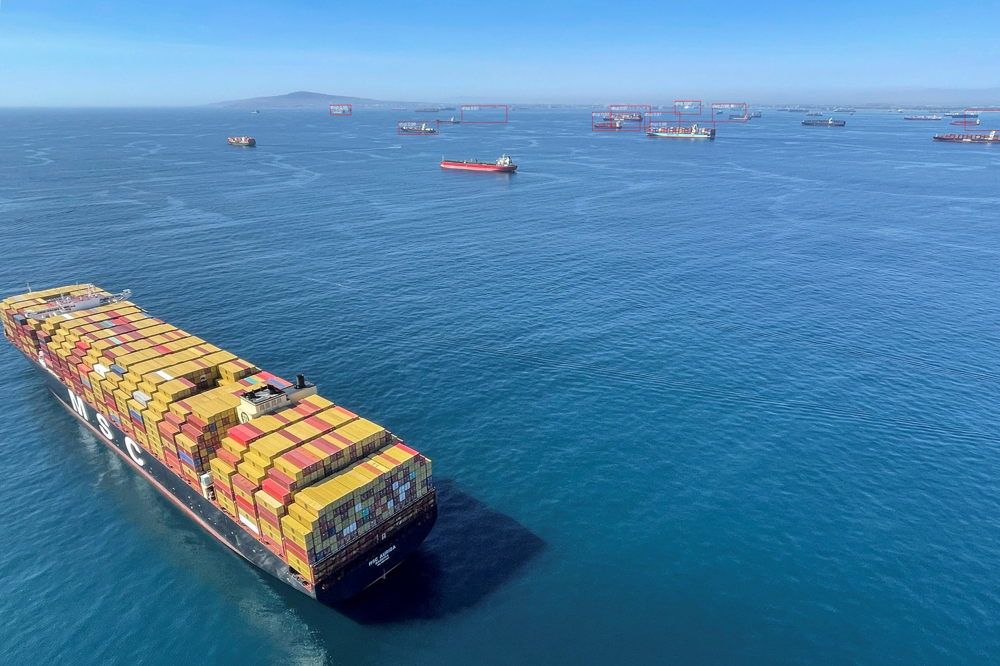

In [33]:
from PIL import ImageDraw, Image
from transformers import pipeline


model_path = "owlvit-base-patch32_FT_cppe5/checkpoint-10000"
detector = pipeline(model=model_path, task="zero-shot-object-detection")

image = f'ship.jpg'
image = Image.open(image)
predictions = detector(
    image,
    candidate_labels=["ship"],
    threshold=0.10,
    top_k=10
)
print(predictions)

draw = ImageDraw.Draw(image)

for prediction in predictions:
    box = prediction["box"]
    label = prediction["label"]
    score = prediction["score"]

    xmin, ymin, xmax, ymax = box.values()
    draw.rectangle((xmin, ymin, xmax, ymax), outline="red", width=1)
    draw.text((xmin, ymin), f"{label}: {round(score,2)}", fill="white")

image

## Raw model

/opt/conda/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.


[]


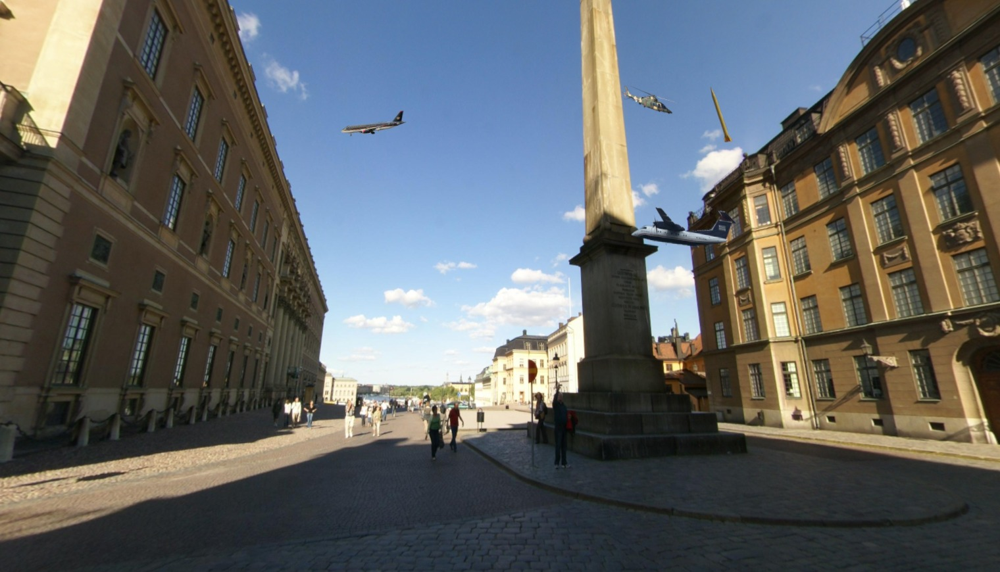

In [43]:
from PIL import ImageDraw, Image
from transformers import pipeline

model_path = "google/owlvit-base-patch32"
detector = pipeline(model=model_path, task="zero-shot-object-detection")

image = f'../novice/images/{vlm_data_test[0]["image"]}'
image = Image.open(image)
predictions = detector(
    image,
    candidate_labels=['white and blue light aircraft',
   'yellow missile',
   'green and brown camouflage helicopter',
   'black and white commercial aircraft'],
    threshold=0.10,
    top_k=3
)
print(predictions)

draw = ImageDraw.Draw(image)

for prediction in predictions:
    box = prediction["box"]
    label = prediction["label"]
    score = prediction["score"]

    xmin, ymin, xmax, ymax = box.values()
    draw.rectangle((xmin, ymin, xmax, ymax), outline="red", width=1)
    draw.text((xmin, ymin), f"{label}: {round(score,2)}", fill="white")

image